<a href="https://colab.research.google.com/github/fitrieratna/DataScience-Portfolio/blob/master/Customer_Segmentation_Credit%20Case.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Customer Segmentation**



# Load Data & Data Description


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import chardet

In [3]:
# To connect Google Drive (GDrive) with Colab
from google.colab import drive
drive.mount("/content/gdrive")

Mounted at /content/gdrive


In [4]:
data = pd.read_csv('/content/gdrive/My Drive/Data Source/Cust_Segmentation.csv')

In [5]:
data.head()

,Customer Id,Age,Edu,Years Employed,Income,Card Debt,Other Debt,Defaulted,Address,DebtIncomeRatio
0,1,41,2,6,19,0.124,1.073,0.0,NBA001,6.3
1,2,47,1,26,100,4.582,8.218,0.0,NBA021,12.8
2,3,33,2,10,57,6.111,5.802,1.0,NBA013,20.9
3,4,29,2,4,19,0.681,0.516,0.0,NBA009,6.3
4,5,47,1,31,253,9.308,8.908,0.0,NBA008,7.2


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 850 entries, 0 to 849
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Customer Id      850 non-null    int64  
 1   Age              850 non-null    int64  
 2   Edu              850 non-null    int64  
 3   Years Employed   850 non-null    int64  
 4   Income           850 non-null    int64  
 5   Card Debt        850 non-null    float64
 6   Other Debt       850 non-null    float64
 7   Defaulted        700 non-null    float64
 8   Address          850 non-null    object 
 9   DebtIncomeRatio  850 non-null    float64
dtypes: float64(4), int64(5), object(1)
memory usage: 66.5+ KB


In [7]:
missing_data = data.isnull()

for column in missing_data.columns.values.tolist():
 print (column)
 print (missing_data[column].value_counts())
 print("")  

Customer Id
False    850
Name: Customer Id, dtype: int64

Age
False    850
Name: Age, dtype: int64

Edu
False    850
Name: Edu, dtype: int64

Years Employed
False    850
Name: Years Employed, dtype: int64

Income
False    850
Name: Income, dtype: int64

Card Debt
False    850
Name: Card Debt, dtype: int64

Other Debt
False    850
Name: Other Debt, dtype: int64

Defaulted
False    700
True     150
Name: Defaulted, dtype: int64

Address
False    850
Name: Address, dtype: int64

DebtIncomeRatio
False    850
Name: DebtIncomeRatio, dtype: int64



# Data Preprocessing & Exploratory Data Analysis




```
 1. Drop unused column
```



In [8]:
df = data.drop(['Address','Defaulted'], axis=1)
df.head()

,Customer Id,Age,Edu,Years Employed,Income,Card Debt,Other Debt,DebtIncomeRatio
0,1,41,2,6,19,0.124,1.073,6.3
1,2,47,1,26,100,4.582,8.218,12.8
2,3,33,2,10,57,6.111,5.802,20.9
3,4,29,2,4,19,0.681,0.516,6.3
4,5,47,1,31,253,9.308,8.908,7.2




```
2. Correlation of Attributes
```



In [9]:
#Find correlation of 

float_columns = [x for x in df.columns if x not in ['Customer Id']]
corr_mat = df[float_columns].corr()

# Strip out the diagonal values for the next step
for x in range(len(float_columns)):
    corr_mat.iloc[x,x] = 0.0
    
corr_mat

,Age,Edu,Years Employed,Income,Card Debt,Other Debt,DebtIncomeRatio
Age,0.000000,0.012983,0.554241,0.476218,0.278912,0.337839,0.008240
Edu,0.012983,0.000000,-0.151117,0.218219,0.099081,0.140938,0.008053
Years Employed,0.554241,-0.151117,0.000000,0.625093,0.381744,0.414430,-0.033625
Income,0.476218,0.218219,0.625093,0.000000,0.551510,0.603356,-0.035585
Card Debt,0.278912,0.099081,0.381744,0.551510,0.000000,0.644955,0.514971
Other Debt,0.337839,0.140938,0.414430,0.603356,0.644955,0.000000,0.572545
DebtIncomeRatio,0.008240,0.008053,-0.033625,-0.035585,0.514971,0.572545,0.000000


In [10]:
corr_mat.abs().idxmax()

Age                Years Employed
Edu                        Income
Years Employed             Income
Income             Years Employed
Card Debt              Other Debt
Other Debt              Card Debt
DebtIncomeRatio        Other Debt
dtype: object

In [11]:
skew_columns = (df[float_columns]
                .skew()
                .sort_values(ascending=False))

skew_columns = skew_columns.loc[skew_columns > 0.75]
skew_columns

#Note that skewness>0.75 is considered as heavy skew so that we need to transform it to log before feature scaling to help standardized the data

Card Debt          3.701790
Income             3.700761
Other Debt         3.206006
Edu                1.216846
DebtIncomeRatio    1.124999
Years Employed     0.862663
dtype: float64

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


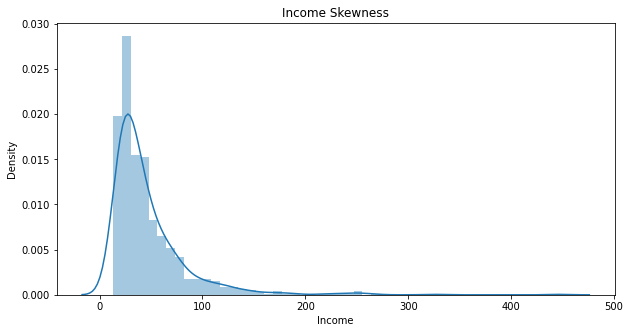

In [12]:
import seaborn as sns

plt.figure(figsize=(10,5))
sns.distplot(df['Income'])
plt.title('Income Skewness')
plt.show()

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


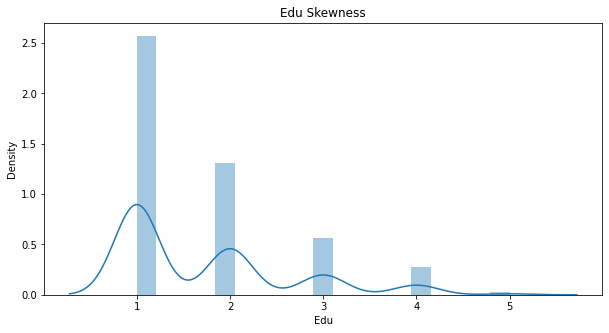

In [13]:
import seaborn as sns

plt.figure(figsize=(10,5))
sns.distplot(df['Edu'])
plt.title('Edu Skewness')
plt.show()

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


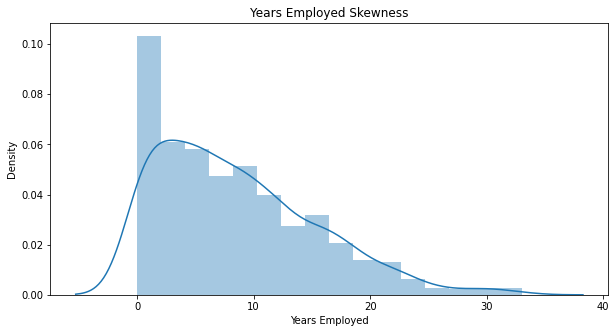

In [14]:
import seaborn as sns

plt.figure(figsize=(10,5))
sns.distplot(df['Years Employed'])
plt.title('Years Employed Skewness')
plt.show()

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


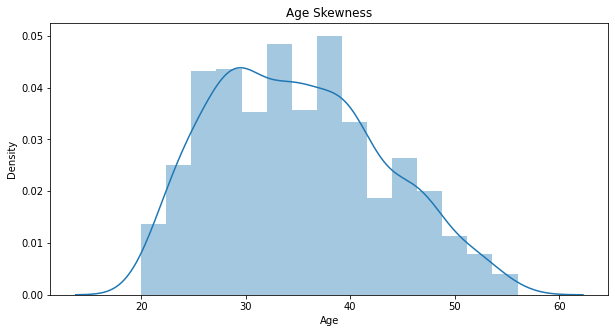

In [15]:
import seaborn as sns

plt.figure(figsize=(10,5))
sns.distplot(df['Age'])
plt.title('Age Skewness')
plt.show()

In [16]:
# Perform log transform on skewed columns
for col in skew_columns.index.tolist():
    df[col] = np.log1p(df[col])
    

In [17]:
df[float_columns]

,Age,Edu,Years Employed,Income,Card Debt,Other Debt,DebtIncomeRatio
0,41,1.098612,1.945910,2.995732,0.116894,0.728997,1.987874
1,47,0.693147,3.295837,4.615121,1.719547,2.221158,2.624669
2,33,1.098612,2.397895,4.060443,1.961643,1.917217,3.086487
3,29,1.098612,1.609438,2.995732,0.519389,0.416075,1.987874
4,47,0.693147,3.465736,5.537334,2.332920,2.293343,2.104134
...,...,...,...,...,...,...,...
845,27,0.693147,1.791759,3.295837,0.436964,0.797507,2.054124
846,28,1.098612,2.079442,3.555348,0.306749,1.105588,2.079442
847,25,1.609438,0.000000,2.944439,1.335527,1.437463,3.538057
848,32,0.693147,2.564949,3.367296,0.109751,0.528273,1.360977




```
2. Feature Scaling


In [18]:
# Feature Scaling using Standard Scaler

from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
df[float_columns] = df[float_columns]
df[float_columns] = sc.fit_transform(df[float_columns])

df.head()

#data[float_columns] = sc.fit_transform(data[float_columns])

#data.head(4)

,Customer Id,Age,Edu,Years Employed,Income,Card Debt,Other Debt,DebtIncomeRatio
0,1,0.742915,0.495768,0.010114,-1.154930,-1.155634,-0.725413,-0.376052
1,2,1.489490,-0.829152,1.517422,1.628014,1.733823,1.657614,0.624170
2,3,-0.252518,0.495768,0.514794,0.674792,2.170302,1.172210,1.349555
3,4,-0.750235,0.495768,-0.365586,-1.154930,-0.429967,-1.225158,-0.376052
4,5,1.489490,-0.829152,1.707129,3.212853,2.839686,1.772895,-0.193441


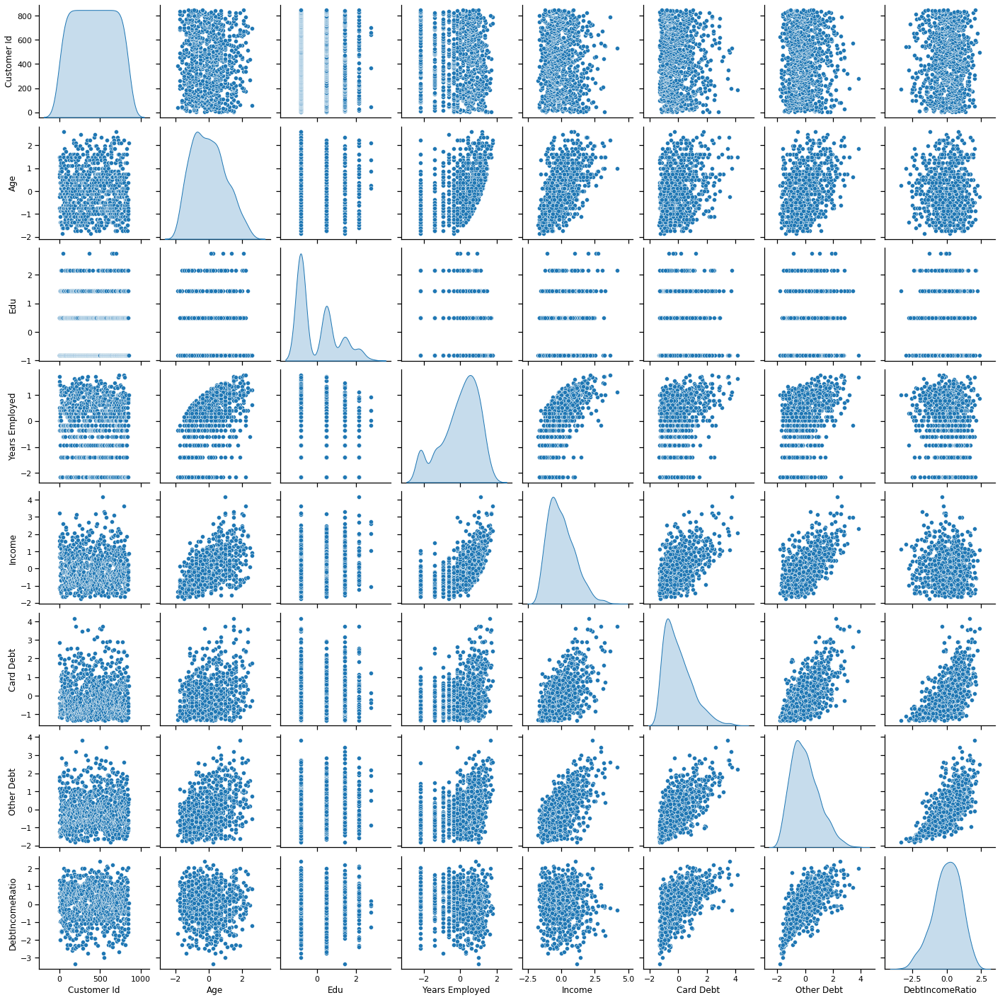

In [22]:
sns.set_context('notebook')

sns.pairplot(df, diag_kind='kde');


# Clustering Model

## 1. K Means

In [79]:
X = df[float_columns]
X

,Age,Edu,Years Employed,Income,Card Debt,Other Debt,DebtIncomeRatio
0,0.742915,0.495768,0.010114,-1.154930,-1.155634,-0.725413,-0.376052
1,1.489490,-0.829152,1.517422,1.628014,1.733823,1.657614,0.624170
2,-0.252518,0.495768,0.514794,0.674792,2.170302,1.172210,1.349555
3,-0.750235,0.495768,-0.365586,-1.154930,-0.429967,-1.225158,-0.376052
4,1.489490,-0.829152,1.707129,3.212853,2.839686,1.772895,-0.193441
...,...,...,...,...,...,...,...
845,-0.999093,-0.829152,-0.162009,-0.639196,-0.578573,-0.616000,-0.271993
846,-0.874664,0.495768,0.159213,-0.193222,-0.813340,-0.123986,-0.232226
847,-1.247951,2.164970,-2.162661,-1.243079,1.041465,0.406029,2.058842
848,-0.376947,-0.829152,0.701324,-0.516392,-1.168512,-1.045976,-1.360729


In [80]:
from sklearn.cluster import KMeans
### BEGIN SOLUTION

X = df[float_columns]
km2 = KMeans(n_clusters=2, random_state=42)
km2 = km2.fit(X)
labels = km2.labels_

n_clusters=2

df['kmeans'] = km2.predict(X)

In [81]:
df.head()

,Customer Id,Age,Edu,Years Employed,Income,Card Debt,Other Debt,DebtIncomeRatio,kmeans,MS,agglom,DBScan
0,1,0.742915,0.495768,0.010114,-1.154930,-1.155634,-0.725413,-0.376052,1,0,0,0
1,2,1.489490,-0.829152,1.517422,1.628014,1.733823,1.657614,0.624170,0,1,1,1
2,3,-0.252518,0.495768,0.514794,0.674792,2.170302,1.172210,1.349555,0,1,1,0
3,4,-0.750235,0.495768,-0.365586,-1.154930,-0.429967,-1.225158,-0.376052,1,0,0,0
4,5,1.489490,-0.829152,1.707129,3.212853,2.839686,1.772895,-0.193441,0,1,1,2


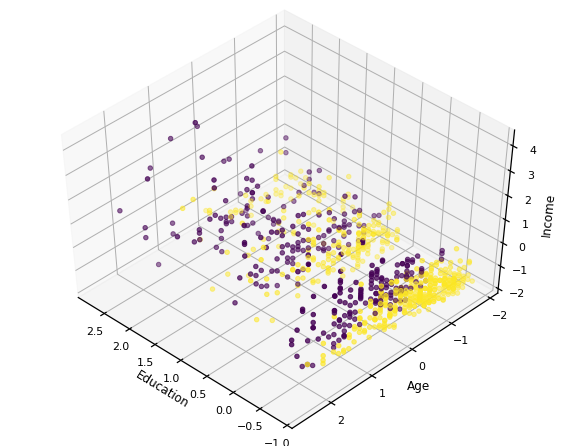

In [82]:
from mpl_toolkits.mplot3d import Axes3D 
fig = plt.figure(1, figsize=(8, 6))
plt.clf()
ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)

Xo = df.values[:,1:]
plt.cla()
# plt.ylabel('Age', fontsize=18)
# plt.xlabel('Income', fontsize=16)
# plt.zlabel('Education', fontsize=16)
ax.set_xlabel('Education')
ax.set_ylabel('Age')
ax.set_zlabel('Income')

ax.scatter(Xo[:, 1], Xo[:, 0], Xo[:, 3], c= labels.astype(np.float))


In [83]:
from sklearn.metrics import silhouette_score
print(f'Silhouette Score(n=2): {silhouette_score(Xo, labels)}')

Silhouette Score(n=2): 0.294629321071033


In [84]:
### BEGIN SOLUTION
# Create and fit a range of models
km_list = list()

for clust in range(1,21):
    km = KMeans(n_clusters=clust, random_state=42)
    km = km.fit(df[float_columns])
    
    km_list.append(pd.Series({'clusters': clust, 
                              'inertia': km.inertia_,
                              'model': km}))

In [85]:
from pandas import DataFrame
df_km_list = DataFrame(km_list)
df_km_list

,clusters,inertia,model
0,1,5950.000000,"KMeans(algorithm='auto', copy_x=True, init='k-..."
1,2,4173.591773,"KMeans(algorithm='auto', copy_x=True, init='k-..."
2,3,3521.013613,"KMeans(algorithm='auto', copy_x=True, init='k-..."
3,4,3153.485936,"KMeans(algorithm='auto', copy_x=True, init='k-..."
4,5,2859.244149,"KMeans(algorithm='auto', copy_x=True, init='k-..."
5,6,2641.352830,"KMeans(algorithm='auto', copy_x=True, init='k-..."
6,7,2478.389518,"KMeans(algorithm='auto', copy_x=True, init='k-..."
7,8,2343.218884,"KMeans(algorithm='auto', copy_x=True, init='k-..."
8,9,2211.763829,"KMeans(algorithm='auto', copy_x=True, init='k-..."
9,10,2123.743688,"KMeans(algorithm='auto', copy_x=True, init='k-..."


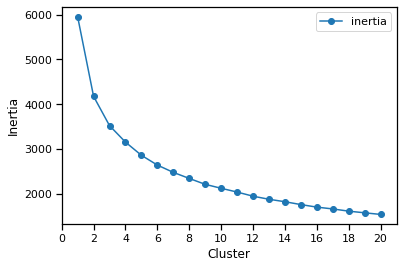

In [27]:
plot_data = (pd.concat(km_list, axis=1)
             .T
             [['clusters','inertia']]
             .set_index('clusters'))

ax = plot_data.plot(marker='o',ls='-')
ax.set_xticks(range(0,21,2))
ax.set_xlim(0,21)
ax.set(xlabel='Cluster', ylabel='Inertia');
### END SOLUTION

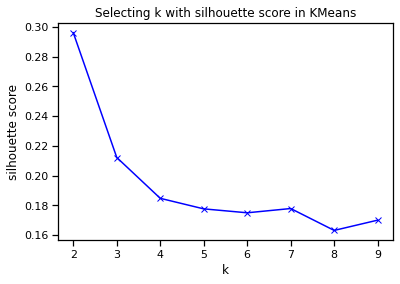

In [33]:
from sklearn.cluster import KMeans

# model = AgglomerativeClustering(n_clusters=3, affinity='euclidean',  linkage='average')
# model.fit(cccd_scaled)

meanDistortions=[]

for k in range(2, 10):
    kmeans_model=KMeans(n_clusters=k, random_state=42)
    kmeans_model.fit(X)
    prediction=kmeans_model.labels_
    meanDistortions.append(silhouette_score(Xo, prediction))


plt.plot(range(2, 10), meanDistortions, 'bx-')
plt.xlabel('k')
plt.ylabel('silhouette score')
plt.title('Selecting k with silhouette score in KMeans');

In [28]:
km_cluster = km2.labels_
km_cluster_list = km_cluster.tolist()
km_cluster = DataFrame(km_cluster)
km_cluster.rename(columns={'0':'Kmeans_Clus'},inplace=True)

km_cluster.value_counts()

1    533
0    317
dtype: int64

## 2. Hierarchical Agglomerative Clustering Model

In [87]:
from sklearn.cluster import AgglomerativeClustering
### BEGIN SOLUTION
ag = AgglomerativeClustering(n_clusters=2, linkage='ward', compute_full_tree=True)
ag = ag.fit(df[float_columns])
df['agglom'] = ag.fit_predict(df[float_columns])

In [88]:
df

,Customer Id,Age,Edu,Years Employed,Income,Card Debt,Other Debt,DebtIncomeRatio,kmeans,MS,agglom,DBScan
0,1,0.742915,0.495768,0.010114,-1.154930,-1.155634,-0.725413,-0.376052,1,0,0,0
1,2,1.489490,-0.829152,1.517422,1.628014,1.733823,1.657614,0.624170,0,1,1,1
2,3,-0.252518,0.495768,0.514794,0.674792,2.170302,1.172210,1.349555,0,1,1,0
3,4,-0.750235,0.495768,-0.365586,-1.154930,-0.429967,-1.225158,-0.376052,1,0,0,0
4,5,1.489490,-0.829152,1.707129,3.212853,2.839686,1.772895,-0.193441,0,1,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...
845,846,-0.999093,-0.829152,-0.162009,-0.639196,-0.578573,-0.616000,-0.271993,1,0,0,1
846,847,-0.874664,0.495768,0.159213,-0.193222,-0.813340,-0.123986,-0.232226,1,0,0,0
847,848,-1.247951,2.164970,-2.162661,-1.243079,1.041465,0.406029,2.058842,1,0,0,-1
848,849,-0.376947,-0.829152,0.701324,-0.516392,-1.168512,-1.045976,-1.360729,1,0,0,1


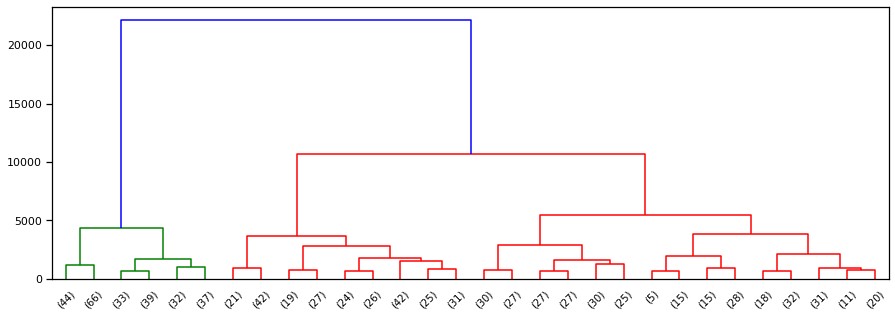

In [449]:
# First, we import the cluster hierarchy module from SciPy (described above) to obtain the linkage and dendrogram functions.
from scipy.cluster import hierarchy

Z = hierarchy.linkage(ag.children_, method='ward')

fig, ax = plt.subplots(figsize=(15,5))


den = hierarchy.dendrogram(Z, orientation='top', 
                           p=30, truncate_mode='lastp',
                           show_leaf_counts=True, ax=ax)
### END SOLUTION

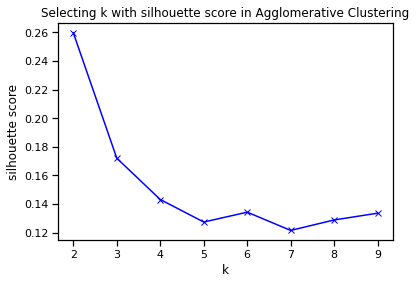

In [34]:
from sklearn.cluster import AgglomerativeClustering

# model = AgglomerativeClustering(n_clusters=3, affinity='euclidean',  linkage='average')
# model.fit(cccd_scaled)

meanDistortions=[]

for k in range(2, 10):
    ag_model=AgglomerativeClustering(n_clusters=k, affinity='euclidean',  linkage='ward')
    ag_model.fit(X)
    prediction=ag_model.labels_
    meanDistortions.append(silhouette_score(Xo, prediction))


plt.plot(range(2, 10), meanDistortions, 'bx-')
plt.xlabel('k')
plt.ylabel('silhouette score')
plt.title('Selecting k with silhouette score in Agglomerative Clustering');

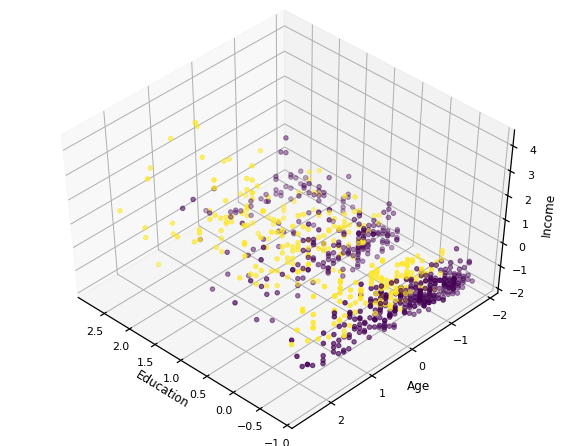

In [89]:
from mpl_toolkits.mplot3d import Axes3D 
fig = plt.figure(1, figsize=(8, 6))
plt.clf()
ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)

Xo = df.values[:,1:]
plt.cla()
# plt.ylabel('Age', fontsize=18)
# plt.xlabel('Income', fontsize=16)
# plt.zlabel('Education', fontsize=16)
ax.set_xlabel('Education')
ax.set_ylabel('Age')
ax.set_zlabel('Income')

ax.scatter(Xo[:, 1], Xo[:, 0], Xo[:, 3], c= ag.labels_.astype(np.float))


In [92]:
ag_cluster = ag.labels_
ag_cluster_list = ag_cluster.tolist()

In [94]:
ag_cluster = DataFrame(ag_cluster_list)
ag_cluster.rename(columns={'0':'Agglo_Clus'},inplace=True)

ag_cluster.value_counts()

0    536
1    314
dtype: int64

In [95]:
#another way to count and see the difference between 2 clustering method
(df[['agglom','kmeans']]
 .groupby(['agglom'])
 .size()
 .to_frame()
 .rename(columns={0:'number'}))

,number
agglom,
0,536
1,314


In [349]:
(df[['agglom','kmeans']]
 .groupby(['kmeans'])
 .size()
 .to_frame()
 .rename(columns={0:'number'}))

,number
kmeans,
0,317
1,533


In [96]:
from sklearn.metrics import silhouette_score
print(f'Silhouette Score(n=2): {silhouette_score(Xo, ag.labels_)}')

Silhouette Score(n=2): 0.2728252671449686


## 3. DBScan (Density Based Spatial Clustering Applications with Noise)

In [351]:
from sklearn.cluster import DBSCAN


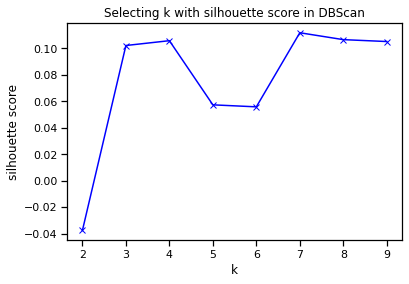

In [52]:
from sklearn.cluster import DBSCAN


meanDistortions=[]

for k in range(2, 10):
    DBScan_model=DBSCAN(eps=1.3, min_samples=k)
    DBScan_model=DBScan_model.fit(df[float_columns])
    prediction=DBScan_model.labels_
    meanDistortions.append(silhouette_score(Xo, prediction))


plt.plot(range(2, 10), meanDistortions, 'bx-')
plt.xlabel('k')
plt.ylabel('silhouette score')
plt.title('Selecting k with silhouette score in DBScan');

In [97]:
DBScan = DBSCAN(eps=1.3, min_samples=3)
DB = DBScan.fit(df[float_columns])
df['DBScan'] = DB.fit_predict(df[float_columns])


In [98]:
df['DBScan'].value_counts()

 1    445
 0    352
-1     46
 3      4
 2      3
Name: DBScan, dtype: int64

In [99]:
#another way to count and see the difference between 2 clustering method
(df[['agglom','kmeans','DBScan']]
 .groupby(['DBScan'])
 .size()
 .to_frame()
 .rename(columns={0:'number'}))

,number
DBScan,
-1,46
0,352
1,445
2,3
3,4


In [100]:
df[df['DBScan']==-1]

,Customer Id,Age,Edu,Years Employed,Income,Card Debt,Other Debt,DebtIncomeRatio,kmeans,MS,agglom,DBScan
7,8,0.867345,1.435814,-2.162661,0.870607,-0.922724,0.663014,-0.312793,1,0,0,-1
17,18,0.991774,2.164970,-1.388703,-0.639196,0.299266,-0.603817,0.351395,1,0,0,-1
43,44,0.245199,2.760734,0.408372,2.601833,-0.220596,1.873919,-0.464566,0,2,1,-1
81,82,-0.625806,1.435814,-2.162661,0.896844,1.498881,2.578187,1.880104,0,0,0,-1
101,102,0.369628,2.164970,0.784072,2.021669,2.515796,1.888078,0.723406,0,2,1,-1
147,148,1.365061,1.435814,-0.614745,0.200046,1.151826,0.171060,0.669051,0,0,1,-1
169,170,1.613920,2.164970,-0.614745,0.276437,-0.139373,0.489178,0.239153,0,0,1,-1
175,176,2.236066,-0.829152,-2.162661,-0.576697,1.018559,0.984841,1.838631,0,0,0,-1
184,185,0.742915,1.435814,-0.935967,-1.538406,0.590735,-0.143666,1.695740,1,0,0,-1
192,193,0.245199,1.435814,1.000863,1.139290,-1.327150,-1.807168,-3.348730,1,0,0,-1


In [101]:
data.loc[17,::]

Customer Id            18
Age                    43
Edu                     4
Years Employed          1
Income                 26
Card Debt           1.519
Other Debt          1.237
Defaulted               0
Address            NBA005
DebtIncomeRatio      10.6
Name: 17, dtype: object

In [428]:
data.loc[849,::]

Customer Id           850
Age                    52
Edu                     1
Years Employed         16
Income                 64
Card Debt           1.866
Other Debt          3.638
Defaulted               0
Address            NBA025
DebtIncomeRatio       8.6
Name: 849, dtype: object

In [102]:
DB_labels = DB.labels_

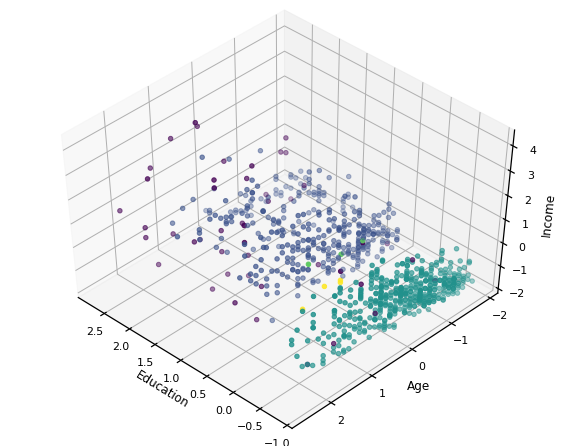

In [103]:
from mpl_toolkits.mplot3d import Axes3D 
fig = plt.figure(1, figsize=(8, 6))
plt.clf()
ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)

Xo = df.values[:,1:]
plt.cla()
# plt.ylabel('Age', fontsize=18)
# plt.xlabel('Income', fontsize=16)
# plt.zlabel('Education', fontsize=16)
ax.set_xlabel('Education')
ax.set_ylabel('Age')
ax.set_zlabel('Income')

ax.scatter(Xo[:, 1], Xo[:, 0], Xo[:, 3], c= DB.labels_.astype(np.float))


In [105]:
from sklearn.metrics import silhouette_score
print(f'Silhouette Score(n=3): {silhouette_score(Xo, DB.labels_)}')

Silhouette Score(n=3): 0.13871128443350159


## 4. Mean Shift Model


In [106]:
from sklearn.cluster import MeanShift

MS = MeanShift(bandwidth=2)
MS = MS.fit(df[float_columns])
df['MS'] = MS.fit_predict(df[float_columns])



In [107]:
df

,Customer Id,Age,Edu,Years Employed,Income,Card Debt,Other Debt,DebtIncomeRatio,kmeans,MS,agglom,DBScan
0,1,0.742915,0.495768,0.010114,-1.154930,-1.155634,-0.725413,-0.376052,1,0,0,0
1,2,1.489490,-0.829152,1.517422,1.628014,1.733823,1.657614,0.624170,0,1,1,1
2,3,-0.252518,0.495768,0.514794,0.674792,2.170302,1.172210,1.349555,0,1,1,0
3,4,-0.750235,0.495768,-0.365586,-1.154930,-0.429967,-1.225158,-0.376052,1,0,0,0
4,5,1.489490,-0.829152,1.707129,3.212853,2.839686,1.772895,-0.193441,0,1,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...
845,846,-0.999093,-0.829152,-0.162009,-0.639196,-0.578573,-0.616000,-0.271993,1,0,0,1
846,847,-0.874664,0.495768,0.159213,-0.193222,-0.813340,-0.123986,-0.232226,1,0,0,0
847,848,-1.247951,2.164970,-2.162661,-1.243079,1.041465,0.406029,2.058842,1,0,0,-1
848,849,-0.376947,-0.829152,0.701324,-0.516392,-1.168512,-1.045976,-1.360729,1,0,0,1


In [108]:
df['MS'].value_counts()

0    764
1     69
2     17
Name: MS, dtype: int64

In [109]:
#another way to count and see the difference between 2 clustering method
(df[['agglom','kmeans','DBScan', 'MS']]
 .groupby(['MS'])
 .size()
 .to_frame()
 .rename(columns={0:'number'}))

,number
MS,
0,764
1,69
2,17


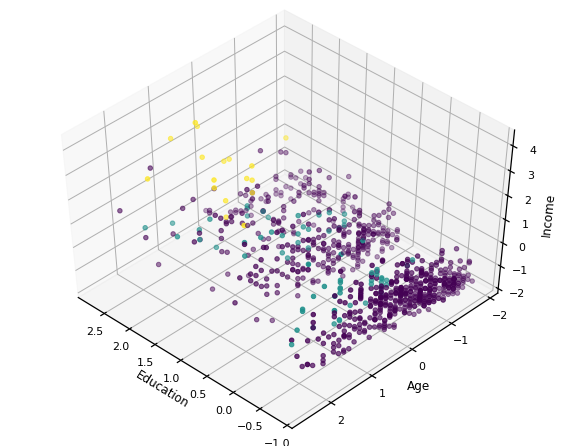

In [110]:
from mpl_toolkits.mplot3d import Axes3D 
fig = plt.figure(1, figsize=(8, 6))
plt.clf()
ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)

Xo = df.values[:,1:]
plt.cla()
# plt.ylabel('Age', fontsize=18)
# plt.xlabel('Income', fontsize=16)
# plt.zlabel('Education', fontsize=16)
ax.set_xlabel('Education')
ax.set_ylabel('Age')
ax.set_zlabel('Income')

ax.scatter(Xo[:, 1], Xo[:, 0], Xo[:, 3], c= MS.labels_.astype(np.float))

In [111]:
from sklearn.metrics import silhouette_score
print(f'Silhouette Score(n=2): {silhouette_score(Xo, MS.labels_)}')

Silhouette Score(n=2): 0.28397966992028456


# Intuitive Meaning with 3D Animation 

In [124]:
data['kmeans']=df['kmeans']
data['agglom']=df['agglom']
data['MS']=df['MS']
data['DBScan']=df['DBScan']

In [128]:
data.groupby('kmeans').mean()

,Customer Id,Age,Edu,Years Employed,Income,Card Debt,Other Debt,Defaulted,DebtIncomeRatio,agglom,MS,DBScan
kmeans,,,,,,,,,,,,
0,413.656151,40.712934,1.813880,13.820189,74.848580,3.013435,5.701880,0.268775,13.143218,0.886435,0.324921,0.410095
1,432.544090,31.649156,1.649156,5.440901,29.919325,0.722398,1.518689,0.257271,8.404315,0.061914,0.000000,0.538462


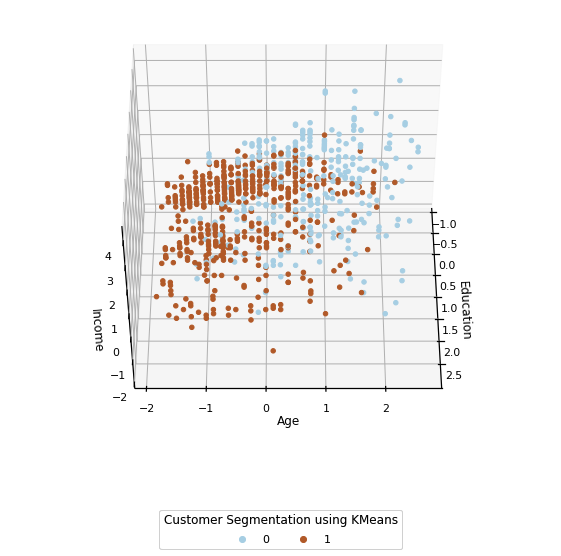

In [486]:
# 3D CLUSTERED MAPPING USING KMeans

from mpl_toolkits.mplot3d import axes3d
import matplotlib.pyplot as plt
from IPython.display import HTML
import matplotlib.animation as animation


fig = plt.figure(1, figsize=(8, 6))
plt.clf()
ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)

Xo = df.values[:,1:]

ax.title('Customer Segmentation using KMeans')
ax.set_xlabel('Education')
ax.set_ylabel('Age')
ax.set_zlabel('Income')

g = ax.scatter(Xo[:, 1], Xo[:, 0], Xo[:, 3], c= labels.astype(np.float), marker='o', depthshade=False, cmap='Paired')


# produce a legend with the unique colors from the scatter
legend = ax.legend(*g.legend_elements(), loc="lower center", title="Customer Segmentation using KMeans", borderaxespad=-10, ncol=4)
ax.add_artist(legend)

#plt.show()

from matplotlib import animation

def rotate(angle):
     ax.view_init(azim=angle)

angle = 1
ani = animation.FuncAnimation(fig, rotate, frames=np.arange(0, 360, angle), interval=15)
#ani.save('Cluster_plot.gif', writer=animation.PillowWriter(fps=25));

HTML(ani.to_html5_video())

In [126]:
data.groupby('agglom').mean()

,Customer Id,Age,Edu,Years Employed,Income,Card Debt,Other Debt,Defaulted,DebtIncomeRatio,kmeans,MS,DBScan
agglom,,,,,,,,,,,,
0,426.046642,32.430970,1.630597,5.639925,30.66791,0.716955,1.607834,0.258503,8.397948,0.932836,0.003731,0.535448
1,424.566879,39.464968,1.847134,13.560510,74.00000,3.044615,5.589675,0.266409,13.199363,0.105096,0.321656,0.414013


In [114]:
data.groupby('DBScan').mean()

,Customer Id,Age,Edu,Years Employed,Income,Card Debt,Other Debt,Defaulted,DebtIncomeRatio,kmeans,agglom,MS
DBScan,,,,,,,,,,,,
-1,419.413043,42.195652,2.956522,8.608696,97.978261,3.532783,5.894913,0.459459,12.571739,0.326087,0.521739,0.543478
0,422.386364,34.031250,2.460227,7.443182,48.500000,1.534861,3.181011,0.303030,9.996875,0.613636,0.417614,0.119318
1,429.251685,34.862921,1.000000,9.128090,37.593258,1.238683,2.488364,0.201657,9.931236,0.678652,0.305618,0.065169
2,451.333333,47.666667,1.000000,29.333333,277.000000,7.787667,12.363667,0.000000,7.300000,0.000000,1.000000,1.000000
3,332.750000,49.500000,1.000000,28.750000,133.750000,15.735250,20.415500,1.000000,26.850000,0.000000,1.000000,1.000000


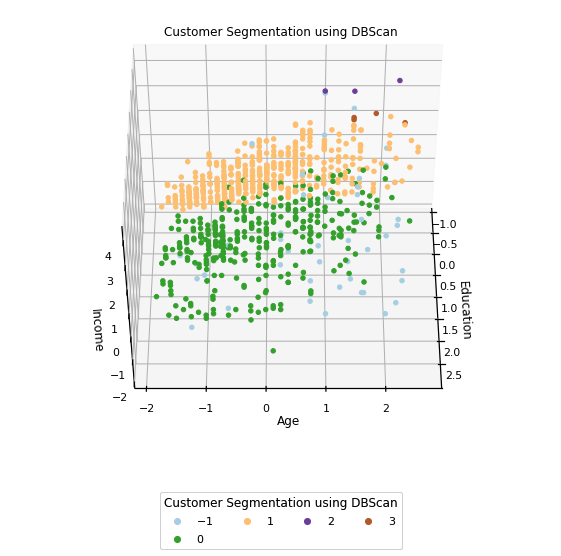

In [116]:
# 3D CLUSTERED MAPPING USING DBScan

from mpl_toolkits.mplot3d import axes3d
import matplotlib.pyplot as plt
from IPython.display import HTML
import matplotlib.animation as animation


fig = plt.figure(1, figsize=(8, 6))
plt.clf()
ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)
plt.cla()
Xo = df.values[:,1:]

ax.set_title('Customer Segmentation using DBScan')
ax.set_xlabel('Education')
ax.set_ylabel('Age')
ax.set_zlabel('Income')

g = ax.scatter(Xo[:, 1], Xo[:, 0], Xo[:, 3], c= DB_labels.astype(np.float), marker='o', depthshade=False, cmap='Paired')



# produce a legend with the unique colors from the scatter
legend = ax.legend(*g.legend_elements(), loc="lower center", title="Customer Segmentation using DBScan", borderaxespad=-10, ncol=4)
ax.add_artist(legend)


from matplotlib import animation

def rotate(angle):
     ax.view_init(azim=angle)

angle = 1
ani = animation.FuncAnimation(fig, rotate, frames=np.arange(0, 360, angle), interval=15)
#ani.save('Cluster_plot.gif', writer=animation.PillowWriter(fps=25));

HTML(ani.to_html5_video())

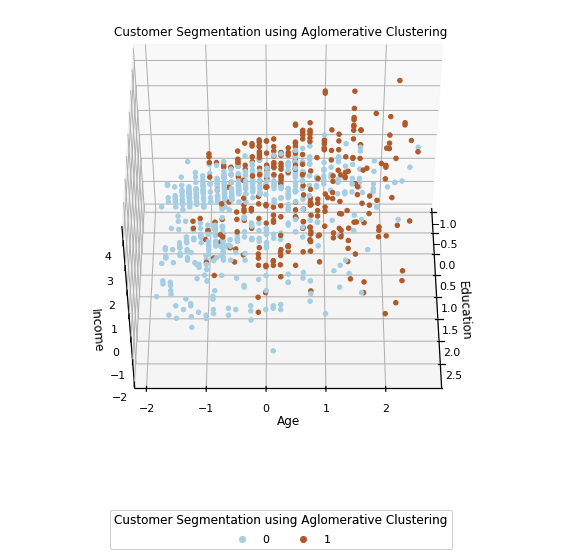

In [491]:
from mpl_toolkits.mplot3d import axes3d
import matplotlib.pyplot as plt
from IPython.display import HTML
import matplotlib.animation as animation


fig = plt.figure(1, figsize=(8, 6))
plt.clf()
ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)

Xo = df.values[:,1:]

ax.set_title("Customer Segmentation using Aglomerative Clustering")
ax.set_xlabel('Education')
ax.set_ylabel('Age')
ax.set_zlabel('Income')

g = ax.scatter(Xo[:, 1], Xo[:, 0], Xo[:, 3], c= ag.labels_.astype(np.float), marker='o', depthshade=False, cmap='Paired')


# produce a legend with the unique colors from the scatter
legend = ax.legend(*g.legend_elements(), loc="lower center", title="Customer Segmentation using Aglomerative Clustering", borderaxespad=-10, ncol=4)
ax.add_artist(legend)

#plt.show()

from matplotlib import animation

def rotate(angle):
     ax.view_init(azim=angle)

angle = 1
ani = animation.FuncAnimation(fig, rotate, frames=np.arange(0, 360, angle), interval=15)
#ani.save('Cluster_plot.gif', writer=animation.PillowWriter(fps=25));

HTML(ani.to_html5_video())

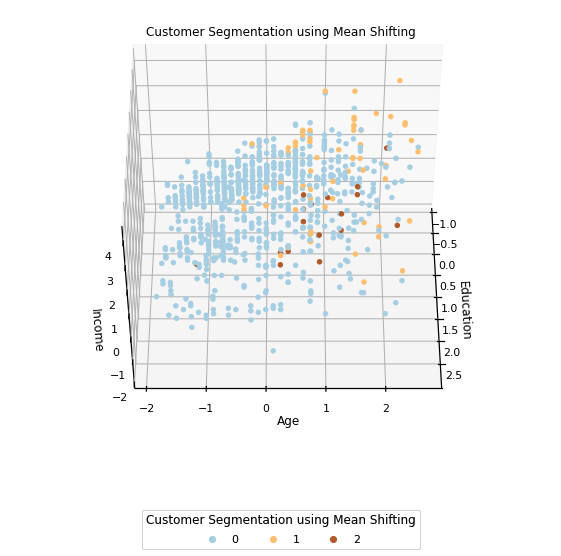

In [492]:
from mpl_toolkits.mplot3d import axes3d
import matplotlib.pyplot as plt
from IPython.display import HTML
import matplotlib.animation as animation


fig = plt.figure(1, figsize=(8, 6))
plt.clf()
ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)

Xo = df.values[:,1:]


ax.set_title("Customer Segmentation using Mean Shifting")
ax.set_xlabel('Education')
ax.set_ylabel('Age')
ax.set_zlabel('Income')

g = ax.scatter(Xo[:, 1], Xo[:, 0], Xo[:, 3], c= MS.labels_.astype(np.float), marker='o', depthshade=False, cmap='Paired')


# produce a legend with the unique colors from the scatter
legend = ax.legend(*g.legend_elements(), loc="lower center", title="Customer Segmentation using Mean Shifting", borderaxespad=-10, ncol=4)
ax.add_artist(legend)

from matplotlib import animation

def rotate(angle):
     ax.view_init(azim=angle)

angle = 1
ani = animation.FuncAnimation(fig, rotate, frames=np.arange(0, 360, angle), interval=15)

HTML(ani.to_html5_video())

In [115]:
data.groupby('MS').mean()

,Customer Id,Age,Edu,Years Employed,Income,Card Debt,Other Debt,Defaulted,DebtIncomeRatio,kmeans,agglom,DBScan
MS,,,,,,,,,,,,
0,424.714660,34.090314,1.674084,7.583770,39.146597,1.090860,2.320893,0.251592,9.476309,0.697644,0.299738,0.502618
1,443.942029,43.724638,1.666667,18.405797,94.971014,5.874696,9.375638,0.338983,17.894203,0.000000,1.000000,0.637681
2,385.941176,41.941176,3.529412,12.764706,189.000000,5.972118,11.580941,0.384615,10.076471,0.000000,0.941176,-0.647059
